In [35]:
import os 
os.chdir("/home/canyon/Bus-Weather-Impacts")
from src.utils import *
import pandas as pd
import os
import osmnx as ox
import numpy as np
import geopandas as gpd
import networkx as nx
from sklearn.neighbors import KDTree
import numpy as np
import requests
pd.options.mode.chained_assignment = None
pd.set_option('display.float_format', '{:.02f}'.format)
from geopy.distance import geodesic
from shapely.ops import linemerge
pd.set_option('display.float_format', lambda x: '%.6f' % x)
pd.set_option('display.max_columns', None)
import contextily as ctx
from src.api import parse_zipped_gtfs
import matplotlib.pyplot as plt
from src.gtfs_segments import GTFS_shape_processor
from shapely.geometry import Point
from plotnine import *
import statsmodels.formula.api as smf
from statsmodels.formula.api import mixedlm
def time_of_day(hour):
    if 5 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 17:
        return 'Afternoon'
    elif 17 <= hour < 21:
        return 'Evening'
    else:
        return 'Night'

In [2]:

# URL of the dataset (replace with actual dataset identifier)
url = "https://data.cityofnewyork.us/resource/erm2-nwe9.json"

# SoQL query parameters to get data for the date '2023-09-29'
params = {
    "$where": "created_date >= '2023-09-28T00:00:00.000' AND created_date < '2023-09-30T00:00:00.000'",
    "$limit": 1000000000,
}

response = requests.get(url, params=params)

# Check if the request was successful
if response.status_code == 200:
    data = pd.DataFrame(response.json())
else:
    print("Error:", response.status_code)

In [3]:
flood_data311 = data.dropna(subset = ["location", 'descriptor']).query("descriptor.str.contains('Flooding')")
flood_data311['geometry'] = flood_data311.apply(lambda x: Point(x.longitude, x.latitude), axis=1)
flood_data311 = gpd.GeoDataFrame(flood_data311, geometry=flood_data311["geometry"], crs = 4326).to_crs(2263)

In [4]:
gtfs_speed = read_speeds_between_dates("2023-09-18", "2023-10-15").query("speed_mph < 70 & speed_mph > 0")
full_trips = pd.read_parquet("/home/data/bus-weather/nyc_trip_shapes.parquet")
gtfs_speed = full_trips.merge(gtfs_speed)

In [5]:
segments = gpd.read_parquet("/home/data/bus-weather/bus_segments_2023_09_18.parquet")
ntas_url = "https://data.cityofnewyork.us/api/geospatial/d3qk-pfyz?method=export&format=GeoJSON"
ntas = gpd.read_file(ntas_url).to_crs(2263)
flood_ntas = flood_data311.overlay(ntas).groupby("ntaname").size().reset_index().rename({0 : "total_flood_complaints"}, axis = 1)
ntas = ntas.merge(flood_ntas, how = "left")
ntas["total_flood_complaints"] = ntas["total_flood_complaints"].fillna(0)
seg_ntas = segments.overlay(ntas)
seg_ntas["seg_length"] = seg_ntas.length
seg_ntas = seg_ntas.sort_values(["shape_id", "stop_id", "prev_stop_id", "seg_length"]).drop_duplicates(["shape_id", "stop_id", "prev_stop_id"], keep = "first")
seg_ntas = seg_ntas[["shape_id", "stop_id", "prev_stop_id", "boroname", "ntaname", "ntacode", "total_flood_complaints"]]
segments = segments.merge(seg_ntas, how = "left")

In [6]:
gtfs_speed["date"] = gtfs_speed.interpolated_time.dt.date.astype(str)
gtfs_speed["hour"] = gtfs_speed.interpolated_time.dt.hour.astype(int)
gtfs_speed["day_of_week"] = gtfs_speed["interpolated_time"].dt.dayofweek

In [7]:
gtfs_speed = gtfs_speed.merge(segments[["shape_id", "stop_id", "prev_stop_id", "boroname", "ntaname", "ntacode", "total_flood_complaints"]])

In [8]:
daytime_speeds_by_nta = gtfs_speed.query("hour > 8 & hour < 20 & day_of_week.isin([1,2,3,4,5])").groupby(["date", "boroname", "ntaname"]).agg(bus_vol = ("unique_trip_id", "nunique")).reset_index()

In [55]:
daytime_speeds_by_nta = gtfs_speed.query("hour > 8 & hour < 20 & day_of_week.isin([1,2,3,4,5])").groupby(["boroname", "ntaname"])["speed_mph"].mean().reset_index()
flood_speeds = gtfs_speed.query("hour > 8 & hour < 20 & date == '2023-09-29'").groupby(["boroname", "ntaname", "total_flood_complaints"]).agg(flood_day_speed = ("speed_mph", "mean"), 
                                                                                                                                                             total_trips = ("unique_trip_id", "nunique")).reset_index()

In [48]:
flood_comp = daytime_speeds_by_nta.merge(flood_speeds)
flood_comp["diff"] = flood_comp["flood_day_speed"] - flood_comp["speed_mph"]
flood_comp["diff_pct"] = flood_comp["diff"] / flood_comp["speed_mph"] * 100

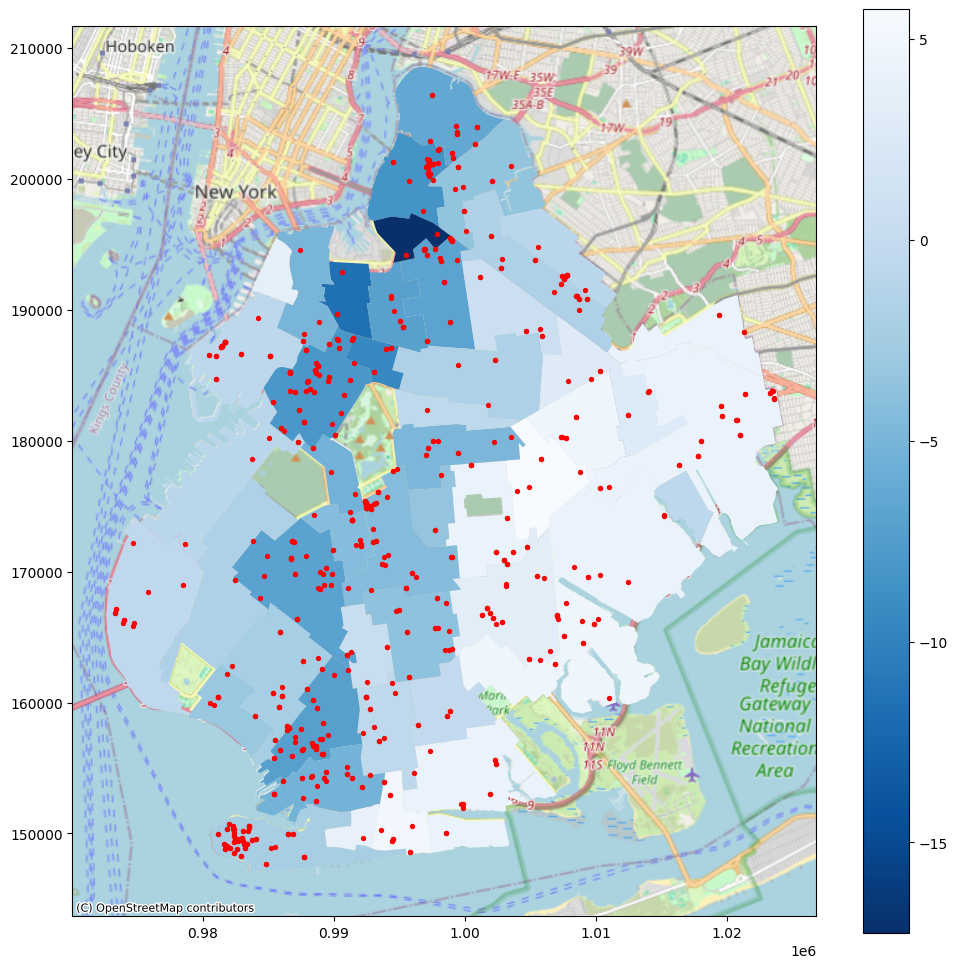

In [53]:
import contextily as ctx
import matplotlib.pyplot as plt

# Create a plot with the 'diff_pct' column from the merged GeoDataFrame
fig, ax = plt.subplots(figsize=(12, 12))  # Set the plot size

ntas.query("~ntaname.str.contains('park-cemetery-etc') & ntaname != 'Rikers Island' & boroname == 'Brooklyn'").merge(flood_comp).plot(column="diff_pct", ax=ax, legend=True, cmap = "Blues_r")
flood_data311.query("borough == 'BROOKLYN'").plot(ax = ax, markersize = 8, color = "red")
# Add a basemap from contextily
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=ntas.crs)

# Show the plot
plt.show()

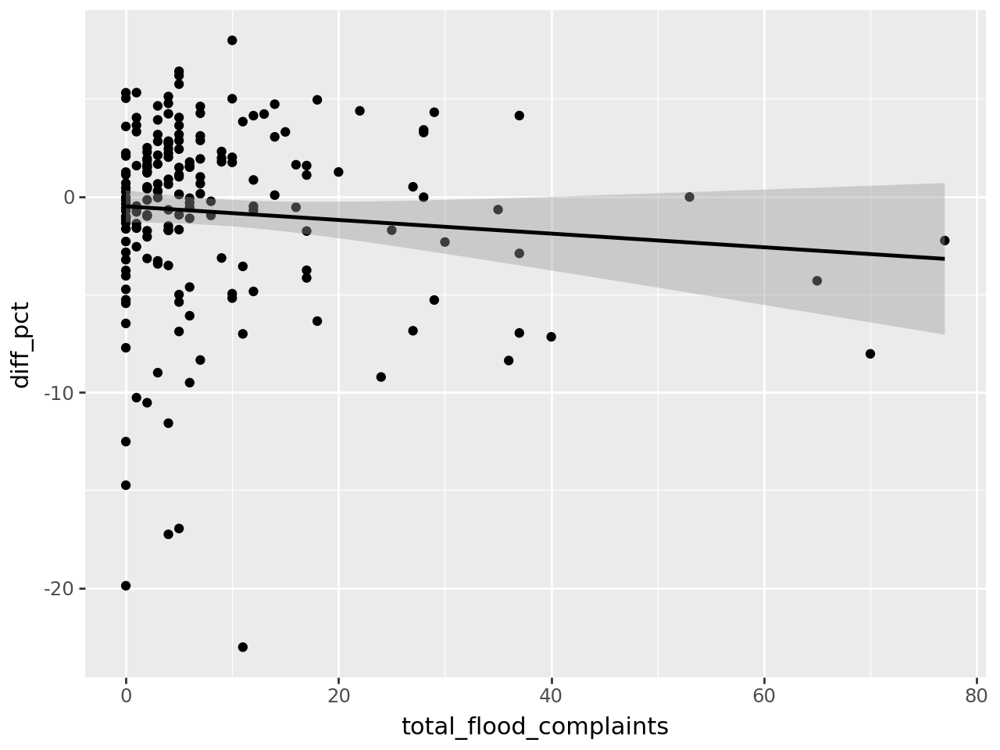

In [54]:
ggplot(flood_comp, aes(x = "total_flood_complaints", y = "diff_pct")) + geom_point() + geom_smooth(method = "lm")

In [130]:
floodnet_hourly = pd.read_parquet("/home/data/bus-weather/Floodnet_hourly_average_Sep28_to_Sep30.parquet")
floodnet_locations = pd.read_parquet("/home/data/bus-weather/Floodnet_locations.parquet")
floodnet_locations['geometry'] = floodnet_locations['coordinates'].apply(lambda x: Point(x[1], x[0]))
floodnet_gdf = gpd.GeoDataFrame(floodnet_locations, geometry='geometry', crs = 4326)[["name", "geometry"]].to_crs(2263)
floodnet_gdf = floodnet_gdf.overlay(ntas)
#floodnet_gdf["geometry"] = floodnet_gdf.geometry.buffer(500)

In [135]:
floodnet_hourly["hour"] = floodnet_hourly["time_dh"].dt.hour.astype(int)
floodnet_hourly["date"] = floodnet_hourly["time_dh"].dt.date.astype(str)
floodnet_hourly["time_of_day"] = floodnet_hourly["hour"].apply(time_of_day)
floodnet_hourly["flood_depth_category"] = pd.cut(floodnet_hourly["avg_flood_inches"], bins = [-1, 0, 5, 15, 1000], labels = ["No flooding", "0 - 5 inches", "5 - 15 inches", "15+ inches"], ordered = True)
floodnet_hourly = floodnet_hourly.merge(floodnet_gdf[["name", "ntaname", "boroname"]])

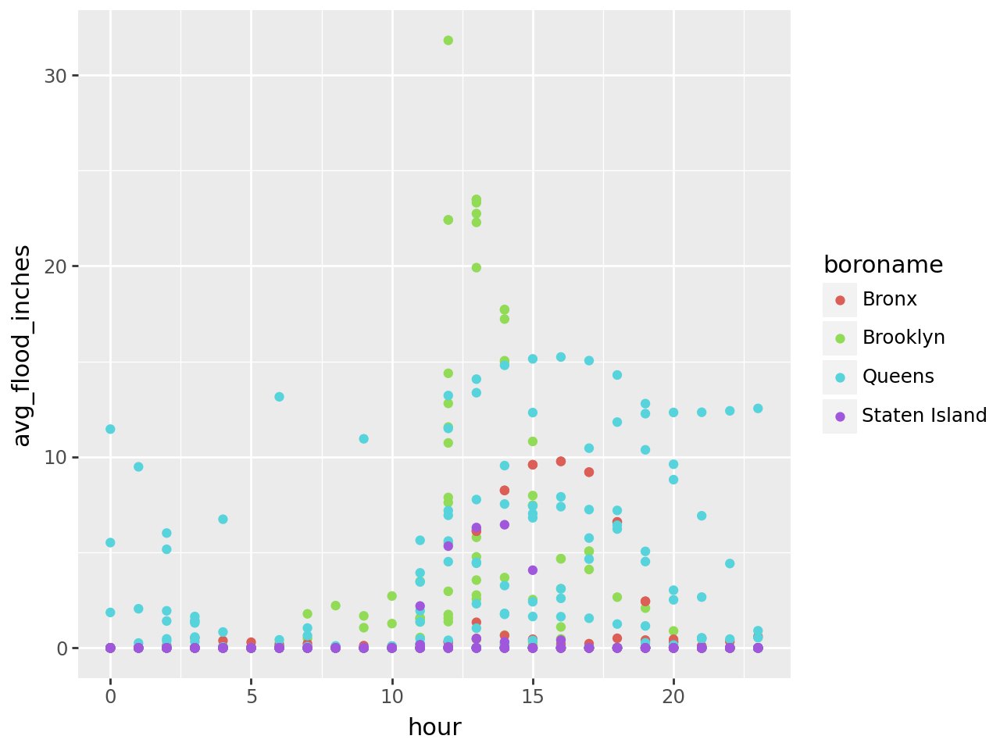

In [160]:
(ggplot(floodnet_hourly.query("date == '2023-09-29'"), aes(x = "hour", y = "avg_flood_inches", color = "boroname")) + geom_point())

In [182]:
floodnet_buffer = floodnet_gdf.copy()
floodnet_buffer["geometry"] = floodnet_buffer.buffer(1000)

In [183]:
seg_floodnet = segments.overlay(floodnet_buffer)
seg_floodnet["seg_length"] = seg_floodnet.length
seg_floodnet = seg_floodnet.sort_values(["shape_id", "stop_id", "prev_stop_id", "seg_length"]).drop_duplicates(["shape_id", "stop_id", "prev_stop_id"], keep = "first")
seg_floodnet = seg_floodnet[["shape_id", "stop_id", "prev_stop_id","name"]]
seg_floodnet = seg_floodnet.merge(floodnet_hourly)

In [184]:
hourly_by_segment = gtfs_speed.query("boroname == 'Brooklyn'").groupby(["date", "hour", "day_of_week", "stop_id", "prev_stop_id"]).agg(avg_speed = ("speed_mph", "mean"),
                                                                    total_buses = ("unique_trip_id", "nunique")).reset_index()

In [185]:
flood_start_hour = 10
flood_end_hour = 20

In [186]:
speed_counts_hourly = hourly_by_segment.query("hour >= @flood_start_hour & hour <= @flood_end_hour & day_of_week.isin([1,2,3,4,5])").groupby(["stop_id", "prev_stop_id", "hour"]).agg(avg_speed = ("avg_speed", "mean"),
                                                                                                                                         hourly_trips = ("total_buses", "mean")).reset_index()
flood_counts_hourly = hourly_by_segment.query("hour >= @flood_start_hour & hour <= @flood_end_hour & date == '2023-09-29'").groupby(["stop_id", "prev_stop_id", "hour"]).agg(avg_speed_flood = ("avg_speed", "mean"),
                                                                                                                                         hourly_trips_flood = ("total_buses", "mean")).reset_index()

flood_comp_hourly = flood_counts_hourly.merge(speed_counts_hourly)
flood_comp_hourly["speed_diff"] = flood_comp_hourly["avg_speed_flood"] - flood_comp_hourly["avg_speed"]
flood_comp_hourly["count_diff"] = flood_comp_hourly["hourly_trips_flood"] - flood_comp_hourly["hourly_trips"]
flood_comp_hourly["speed_diff_pct"] = flood_comp_hourly["speed_diff"] / flood_comp_hourly["avg_speed"] * 100
flood_comp_hourly["count_diff_pct"] = flood_comp_hourly["count_diff"] / flood_comp_hourly["hourly_trips"] * 100

In [187]:
flood_comp_hourly.merge(seg_floodnet.query("date == '2023-09-29'"))

,stop_id,prev_stop_id,hour,avg_speed_flood,hourly_trips_flood,avg_speed,hourly_trips,speed_diff,count_diff,speed_diff_pct,count_diff_pct,shape_id,name,date,avg_flood_inches,time_dh,time_of_day,flood_depth_category,ntaname,boroname
0,200441,805031,12,25.565583,2.000000,42.842690,1.529412,-17.277107,0.470588,-40.326849,30.769231,SIM4C0165,SI - Willow Rd E/Nina Ave,2023-09-29,0.000000,2023-09-29 12:00:00,Afternoon,No flooding,Port Richmond,Staten Island
1,200441,805031,12,25.565583,2.000000,42.842690,1.529412,-17.277107,0.470588,-40.326849,30.769231,SIM4C0166,SI - Willow Rd E/Nina Ave,2023-09-29,0.000000,2023-09-29 12:00:00,Afternoon,No flooding,Port Richmond,Staten Island
2,200441,805031,13,22.810523,1.000000,40.050718,1.750000,-17.240195,-0.750000,-43.045908,-42.857143,SIM4C0165,SI - Willow Rd E/Nina Ave,2023-09-29,0.000000,2023-09-29 13:00:00,Afternoon,No flooding,Port Richmond,Staten Island
3,200441,805031,13,22.810523,1.000000,40.050718,1.750000,-17.240195,-0.750000,-43.045908,-42.857143,SIM4C0166,SI - Willow Rd E/Nina Ave,2023-09-29,0.000000,2023-09-29 13:00:00,Afternoon,No flooding,Port Richmond,Staten Island
4,200441,805031,14,13.805067,1.000000,34.520583,1.388889,-20.715516,-0.388889,-60.009172,-28.000000,SIM4C0165,SI - Willow Rd E/Nina Ave,2023-09-29,0.000000,2023-09-29 14:00:00,Afternoon,No flooding,Port Richmond,Staten Island
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2506,903205,805039,18,9.618416,2.000000,14.100088,2.352941,-4.481671,-0.352941,-31.784705,-15.000000,X280049,BK - Henry St/Mill St,2023-09-29,0.000000,2023-09-29 18:00:00,Evening,No flooding,Carroll Gardens-Columbia Street-Red Hook,Brooklyn
2507,903205,805039,18,9.618416,2.000000,14.100088,2.352941,-4.481671,-0.352941,-31.784705,-15.000000,X280056,BK - Henry St/Mill St,2023-09-29,0.000000,2023-09-29 18:00:00,Evening,No flooding,Carroll Gardens-Columbia Street-Red Hook,Brooklyn
2508,903205,805039,18,9.618416,2.000000,14.100088,2.352941,-4.481671,-0.352941,-31.784705,-15.000000,X280057,BK - Henry St/Mill St,2023-09-29,0.000000,2023-09-29 18:00:00,Evening,No flooding,Carroll Gardens-Columbia Street-Red Hook,Brooklyn
2509,903205,805039,18,9.618416,2.000000,14.100088,2.352941,-4.481671,-0.352941,-31.784705,-15.000000,X281329,BK - Henry St/Mill St,2023-09-29,0.000000,2023-09-29 18:00:00,Evening,No flooding,Carroll Gardens-Columbia Street-Red Hook,Brooklyn


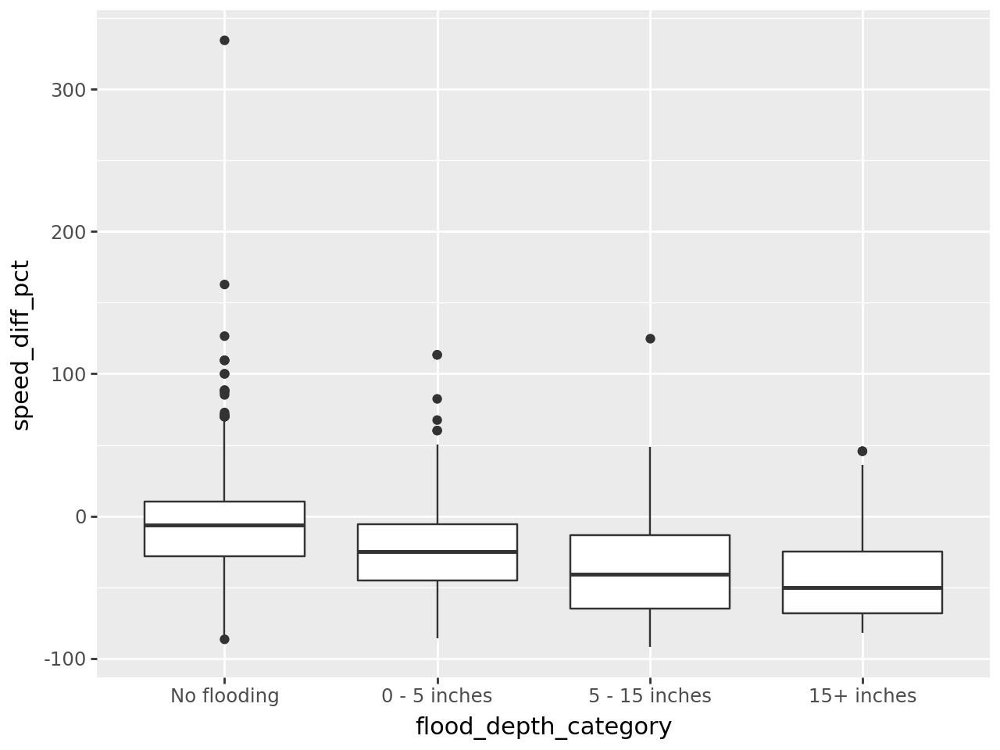

In [188]:
plot_dat = flood_comp_hourly.merge(seg_floodnet.query("date == '2023-09-29'"))
(ggplot(plot_dat, aes(x = "flood_depth_category", y = "speed_diff_pct")) + geom_boxplot()) 

/tmp/ipykernel_17306/1621125134.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


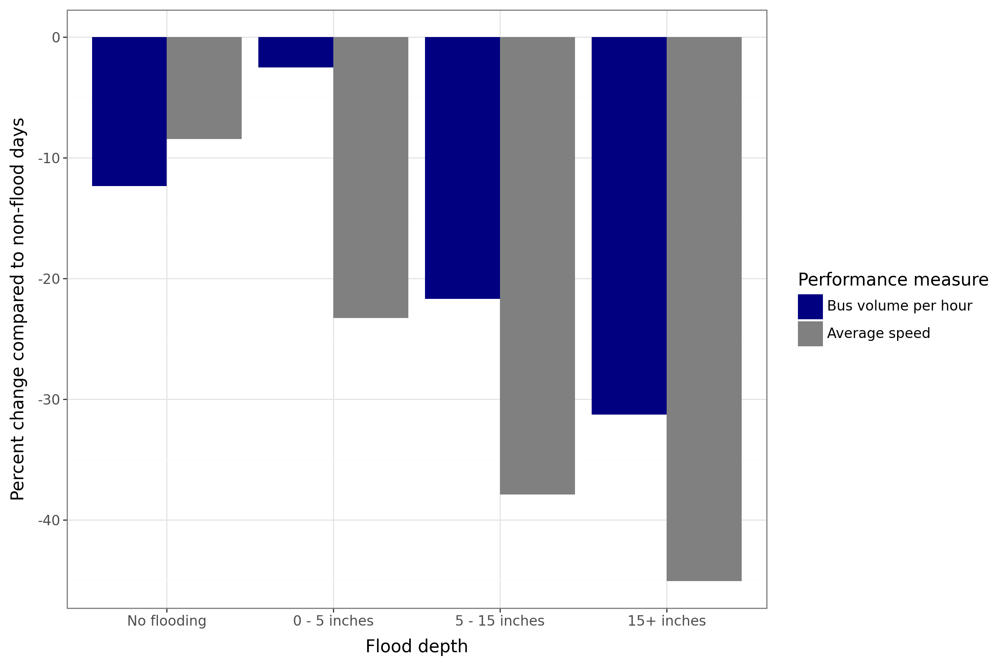

In [204]:
plot_dat = flood_comp_hourly.merge(seg_floodnet.query("date == '2023-09-29'"))
plot_dat = plot_dat.groupby("flood_depth_category")[["count_diff_pct", "speed_diff_pct"]].mean().reset_index().melt(id_vars = ["flood_depth_category"])
(ggplot(plot_dat, aes(x = "flood_depth_category", y = "value", fill = "variable")) + geom_bar(stat = "identity", position = "dodge") + labs(y = "Percent change compared to non-flood days", x = "Flood depth") + theme_bw(base_size = 15) + theme(figure_size = (12,8)) + scale_fill_manual(name = "Performance measure", labels = ["Bus volume per hour", "Average speed"], values = ["navy", "grey"])) 

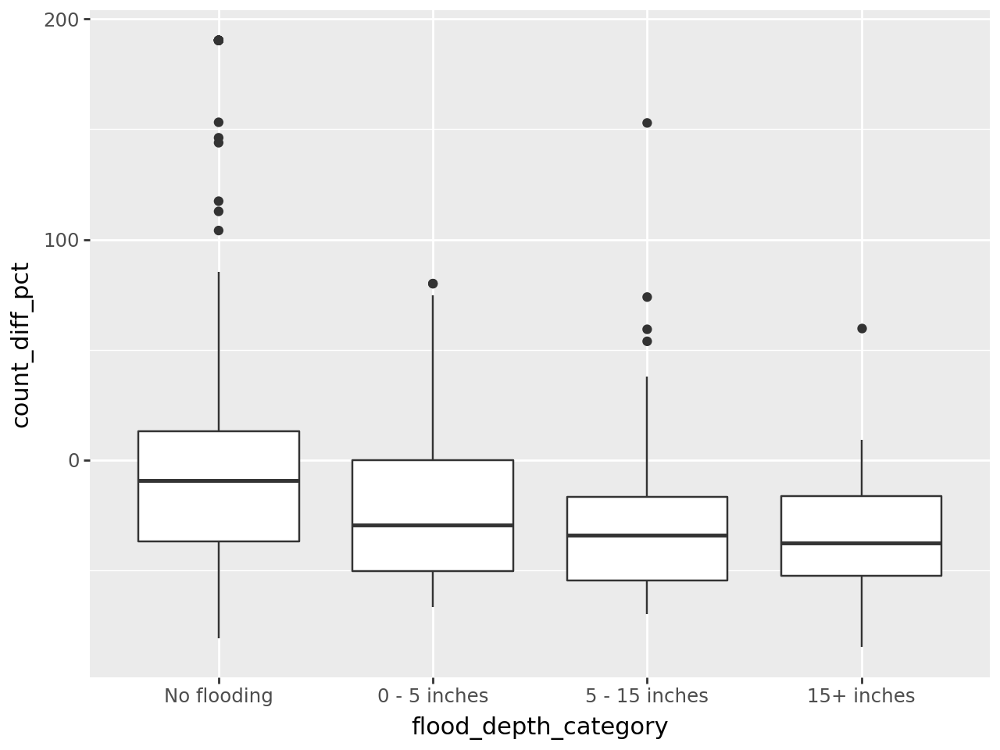

In [181]:
(ggplot(plot_dat, aes(x = "flood_depth_category", y = "count_diff_pct")) + geom_boxplot()) 

In [37]:
smf.ols("speed_diff_pct ~ flood_depth_category+ time_of_day", plot_dat).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         speed_diff_pct   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     20.75
Date:                Fri, 25 Oct 2024   Prob (F-statistic):           3.10e-24
Time:                        18:43:09   Log-Likelihood:                -33463.
No. Observations:                7093   AIC:                         6.694e+04
Df Residuals:                    7086   BIC:                         6.699e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -6.4650      0.730     -8.852      0.000      -7.897      -5.033
flood_depth_category[T.0 - 5 inches]      0.2159      1.720      0.125      0.900      -3.157       3.588
flood_depth_category[T.5 - 15 inches]   -19.6946      2.943     -6.692      0.000     -25.464     -13.926
flood_depth_category[T.15+ inches]      -30.1290      4.456     -6.762      0.000     -38.864     -21.394
time_of_day[T.Evening]                    2.8487      1.025      2.779      0.005       0.839       4.858
time_of_day[T.Morning]                   -2.3068      0.918     -2.513      0.012      -4.106      -0.507
time_of_day[T.Night]                      0.8860      0.975      0.909      0.363      -1.025       2.797
==============================================================================
Omnibus:                      977.485   Durbin-Watson:                   0.595
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             4953.323
Skew:                           0.568   Prob(JB):                         0.00
Kurtosis:                       6.933   Cond. No.                         15.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [300]:
sm.ols("count_diff ~ avg_flood_inches + time_of_day", plot_dat).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             count_diff   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     17.85
Date:                Wed, 23 Oct 2024   Prob (F-statistic):           1.42e-14
Time:                        18:35:55   Log-Likelihood:                -11192.
No. Observations:                5515   AIC:                         2.239e+04
Df Residuals:                    5510   BIC:                         2.243e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 -0.4084      0.047     -8.722      0.000      -0.500      -0.317
time_of_day[T.Evening]     0.3208      0.084      3.824      0.000       0.156       0.485
time_of_day[T.Morning]     0.4040      0.060      6.693      0.000       0.286       0.522
time_of_day[T.Night]       0.4916      0.080      6.158      0.000       0.335       0.648
avg_flood_inches          -0.0230      0.012     -1.985      0.047      -0.046      -0.000
==============================================================================
Omnibus:                     1057.747   Durbin-Watson:                   0.530
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             9000.986
Skew:                           0.674   Prob(JB):                         0.00
Kurtosis:                       9.112   Cond. No.                         9.76
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [241]:
speed_counts = hourly_by_segment.query("hour >= @flood_start_hour & hour <= @flood_end_hour & day_of_week.isin([1,2,3,4,5])").groupby(["stop_id", "prev_stop_id"]).agg(avg_speed = ("avg_speed", "mean"),
                                                                                                                                         hourly_trips = ("total_buses", "mean")).reset_index()

In [242]:
flood_counts = hourly_by_segment.query("hour >= @flood_start_hour & hour <= @flood_end_hour & date == '2023-09-29'").groupby(["stop_id", "prev_stop_id"]).agg(avg_speed_flood = ("avg_speed", "mean"),
                                                                                                                                         hourly_trips_flood = ("total_buses", "mean")).reset_index()

In [244]:
flood_comp = flood_counts.merge(speed_counts)
flood_comp["speed_diff"] = flood_comp["avg_speed_flood"] - flood_comp["avg_speed"]
flood_comp["count_diff"] = flood_comp["hourly_trips_flood"] - flood_comp["hourly_trips"]
flood_comp["speed_diff_pct"] = flood_comp["speed_diff"] / flood_comp["avg_speed"] * 100
flood_comp["count_diff_pct"] = flood_comp["count_diff"] / flood_comp["hourly_trips"] * 100

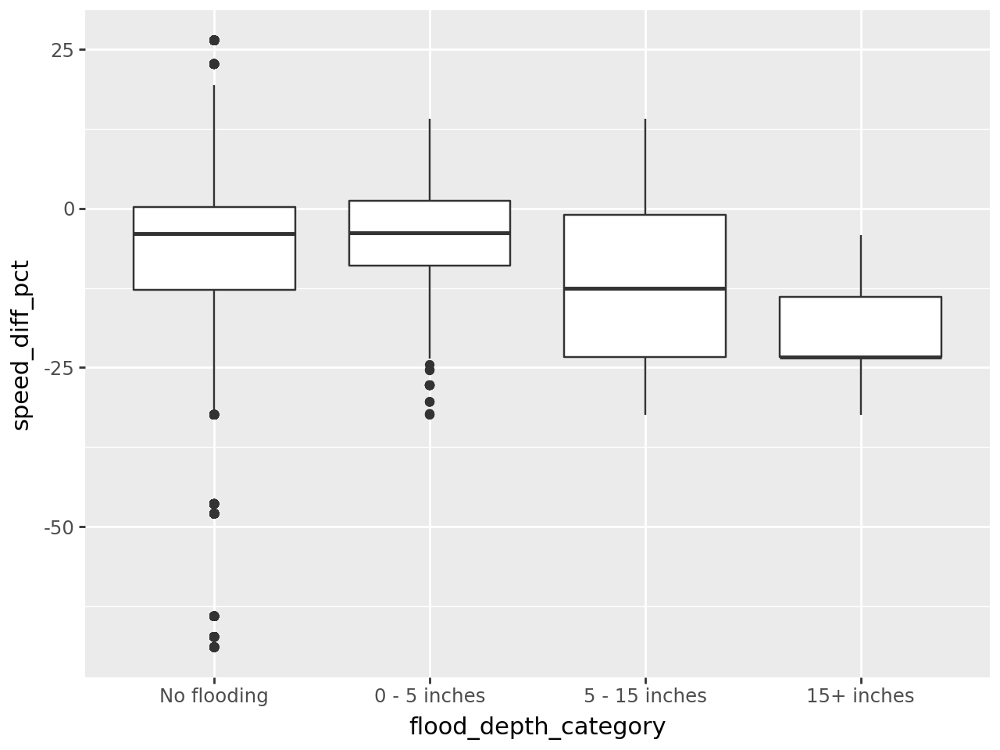

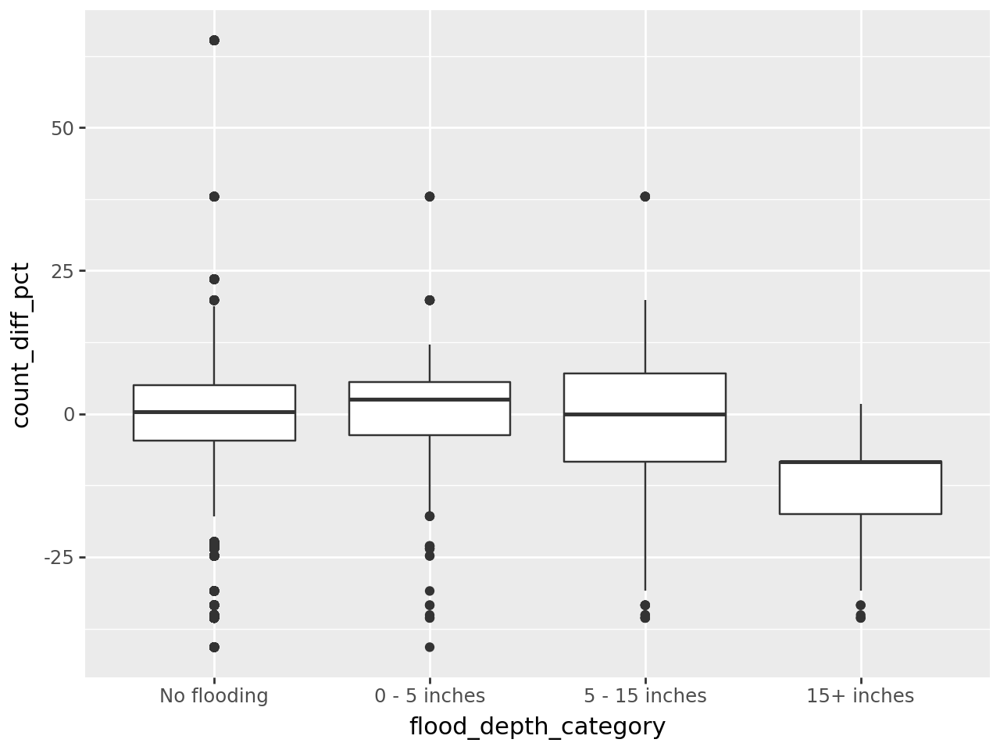

In [246]:
(ggplot(flood_comp.merge(seg_floodnet), aes(x = "flood_depth_category", y = "count_diff_pct")) + geom_boxplot()) 

In [208]:
sm.ols("speed_diff_pct ~ flood_depth_category", plot_dat).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         speed_diff_pct   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     31.30
Date:                Wed, 23 Oct 2024   Prob (F-statistic):           4.13e-20
Time:                        16:41:22   Log-Likelihood:                -34020.
No. Observations:                8094   AIC:                         6.805e+04
Df Residuals:                    8090   BIC:                         6.808e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -9.2702      0.183    -50.693      0.000      -9.629      -8.912
flood_depth_category[T.0 - 5 inches]      0.9374      1.255      0.747      0.455      -1.523       3.398
flood_depth_category[T.5 - 15 inches]   -12.5378      2.171     -5.774      0.000     -16.794      -8.281
flood_depth_category[T.15+ inches]      -23.3774      3.012     -7.761      0.000     -29.282     -17.473
==============================================================================
Omnibus:                     2293.624   Durbin-Watson:                   0.018
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             7306.329
Skew:                          -1.442   Prob(JB):                         0.00
Kurtosis:                       6.654   Cond. No.                         16.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [209]:
sm.ols("count_diff_pct ~ flood_depth_category", plot_dat).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         count_diff_pct   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     25.28
Date:                Wed, 23 Oct 2024   Prob (F-statistic):           2.86e-16
Time:                        16:44:32   Log-Likelihood:                -32994.
No. Observations:                8094   AIC:                         6.600e+04
Df Residuals:                    8090   BIC:                         6.602e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -2.3753      0.161    -14.744      0.000      -2.691      -2.059
flood_depth_category[T.0 - 5 inches]      1.8053      1.106      1.633      0.103      -0.362       3.973
flood_depth_category[T.5 - 15 inches]    -3.2144      1.913     -1.680      0.093      -6.964       0.535
flood_depth_category[T.15+ inches]      -22.2268      2.654     -8.376      0.000     -27.428     -17.025
==============================================================================
Omnibus:                      356.174   Durbin-Watson:                   0.022
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              948.661
Skew:                           0.214   Prob(JB):                    1.00e-206
Kurtosis:                       4.622   Cond. No.                         16.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

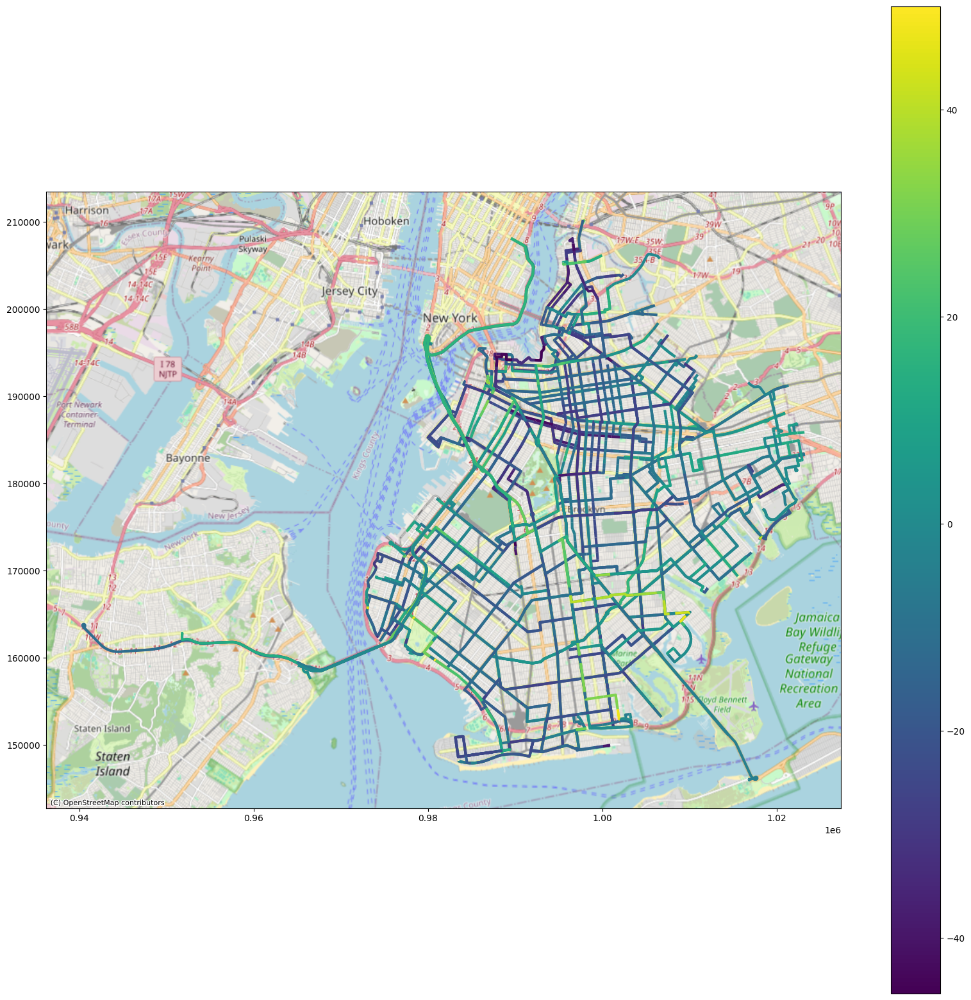

In [108]:
import contextily as ctx
import matplotlib.pyplot as plt

# Create a plot with the 'diff_pct' column from the merged GeoDataFrame
fig, ax = plt.subplots(figsize=(20, 20))  # Set the plot size

segments.query("boroname == 'Brooklyn'").drop_duplicates(["stop_id", "prev_stop_id"])[["stop_id", "prev_stop_id", "stop_name", "prev_stop_name", "ntaname", "geometry"]].merge(flood_comp.query("count_diff_pct < 50")).plot(column = "count_diff_pct", ax = ax, legend = True, linewidth = 3)

# Add a basemap from contextily
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=ntas.crs)

# Show the plot
plt.show()

In [114]:
hourly_by_nta = gtfs_speed.groupby(["date", "hour", "day_of_week", "boroname", "ntaname"]).agg(avg_speed = ("speed_mph", "mean"),
                                                                    total_buses = ("unique_trip_id", "nunique")).reset_index()

speed_counts_nta = hourly_by_nta.query("hour >= @flood_start_hour & hour <= @flood_end_hour & day_of_week.isin([1,2,3,4,5])").groupby(["ntaname"]).agg(avg_speed = ("avg_speed", "mean"),
                                                                                                                                         hourly_trips = ("total_buses", "mean")).reset_index()
flood_counts_nta = hourly_by_nta.query("hour >= @flood_start_hour & hour <= @flood_end_hour & date == '2023-09-29'").groupby(["boroname", "ntaname"]).agg(avg_speed_flood = ("avg_speed", "mean"),
                                                                                                                                         hourly_trips_flood = ("total_buses", "mean")).reset_index()

flood_comp_nta = flood_counts_nta.merge(speed_counts_nta)
flood_comp_nta["speed_diff"] = flood_comp_nta["avg_speed_flood"] - flood_comp_nta["avg_speed"]
flood_comp_nta["count_diff"] = flood_comp_nta["hourly_trips_flood"] - flood_comp_nta["hourly_trips"]
flood_comp_nta["speed_diff_pct"] = flood_comp_nta["speed_diff"] / flood_comp_nta["avg_speed"] * 100
flood_comp_nta["count_diff_pct"] = flood_comp_nta["count_diff"] / flood_comp_nta["hourly_trips"] * 100

In [280]:
flood_nta_dist = floodnet_gdf.overlay(ntas).merge(floodnet_hourly).groupby("ntaname")["avg_flood_inches"].describe().reset_index()

In [297]:
floodnet_gdf.overlay(ntas)

,name,ntacode,shape_area,ntaname,shape_leng,boroname,borocode,countyfips,total_flood_complaints,geometry
0,Q - 126th St/109th Ave,QN55,82461747.3901,South Ozone Park,36708.343978,Queens,4,081,18.000000,"POLYGON ((1035793.709 188472.455, 1035786.509 ..."
1,BX - Edgewater Rd/Seneca Ave,BX27,49734670.5573,Hunts Point,44778.6189953,Bronx,2,005,4.000000,"POLYGON ((1016893.542 237656.348, 1016877.012 ..."
2,BX - Edgewater Rd/Seneca Ave,BX09,51958970.2168,Soundview-Castle Hill-Clason Point-Harding Park,67150.4777794,Bronx,2,005,17.000000,"POLYGON ((1016912.664 237752.482, 1016905.465 ..."
3,M - Broadway/W 157th St,MN36,23100222.7507,Washington Heights South,22096.3050294,Manhattan,1,061,2.000000,"POLYGON ((999933.846 243168.813, 999926.646 24..."
4,BK - 35th St/3rd Ave,BK32,50067191.2566,Sunset Park West,84583.6112985,Brooklyn,3,047,5.000000,"POLYGON ((983369.458 178082.232, 983362.258 17..."
...,...,...,...,...,...,...,...,...,...,...
315,SI - Bedford Ave/Kiswick St,SI45,55434866.7628,New Dorp-Midland Beach,34339.0694807,Staten Island,5,085,27.000000,"POLYGON ((958282.760 148845.688, 958275.561 14..."
316,BK - Morgan Ave/Johnson Ave,BK90,39141060.0713,East Williamsburg,49188.6200769,Brooklyn,3,047,11.000000,"POLYGON ((1002887.135 197666.809, 1002935.672 ..."
317,BK - Morgan Ave/Johnson Ave,BK77,25020783.0186,Bushwick North,26402.8839603,Brooklyn,3,047,8.000000,"POLYGON ((1003482.273 197127.408, 1003475.073 ..."
318,BK - Morgan Ave/Johnson Ave,BK78,40192390.2146,Bushwick South,40778.2982055,Brooklyn,3,047,25.000000,"POLYGON ((1002598.175 196859.220, 1002568.946 ..."


In [292]:
ntas.merge(flood_nta_dist)

,ntacode,shape_area,ntaname,shape_leng,boroname,borocode,countyfips,geometry,total_flood_complaints,count,mean,std,min,25%,50%,75%,max
0,BK75,32629833.1149,Bedford,29992.9191744,Brooklyn,3,047,"MULTIPOLYGON (((1000351.303 194574.900, 999670...",27.000000,270.000000,0.704962,3.222844,0.000000,0.000000,0.000000,0.000000,22.744240
1,BK81,32730861.1091,Brownsville,27300.781233,Brooklyn,3,047,"MULTIPOLYGON (((1012326.803 178803.577, 101229...",7.000000,53.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,BK85,19397527.2993,East New York (Pennsylvania Ave),24226.8507771,Brooklyn,3,047,"MULTIPOLYGON (((1012326.803 178803.577, 101232...",4.000000,48.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,BX35,16891753.5163,Morrisania-Melrose,27740.8457413,Bronx,2,005,"MULTIPOLYGON (((1012761.806 243267.413, 101281...",0.000000,48.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,QN12,61904116.8013,Hammels-Arverne-Edgemere,83820.1206501,Queens,4,081,"MULTIPOLYGON (((1048650.082 157173.057, 104869...",29.000000,133.000000,1.820412,3.468158,0.000000,0.000000,0.000000,1.307589,13.362205
5,SI36,67010738.0679,Old Town-Dongan Hills-South Beach,41963.9002365,Staten Island,5,085,"MULTIPOLYGON (((966187.482 153868.426, 966187....",37.000000,190.000000,0.622289,3.745690,0.000000,0.000000,0.000000,0.000000,29.475066
6,BX55,16260511.4214,Soundview-Bruckner,19755.305501,Bronx,2,005,"MULTIPOLYGON (((1022898.048 242884.698, 102290...",6.000000,48.000000,0.027946,0.193614,0.000000,0.000000,0.000000,0.000000,1.341395
7,BX10,40248130.5227,Pelham Bay-Country Club-City Island,139408.564885,Bronx,2,005,"MULTIPOLYGON (((1042822.450 243439.814, 104255...",9.000000,176.000000,0.657790,2.115685,0.000000,0.000000,0.000000,0.096063,9.768979
8,SI22,56064920.5158,West New Brighton-New Brighton-St. George,67956.5058252,Staten Island,5,085,"MULTIPOLYGON (((964105.855 171704.149, 963907....",6.000000,48.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,SI45,55434866.7628,New Dorp-Midland Beach,34339.0694807,Staten Island,5,085,"MULTIPOLYGON (((960721.609 147492.642, 960370....",27.000000,96.000000,0.267147,1.146087,0.000000,0.000000,0.000000,0.000000,6.450284


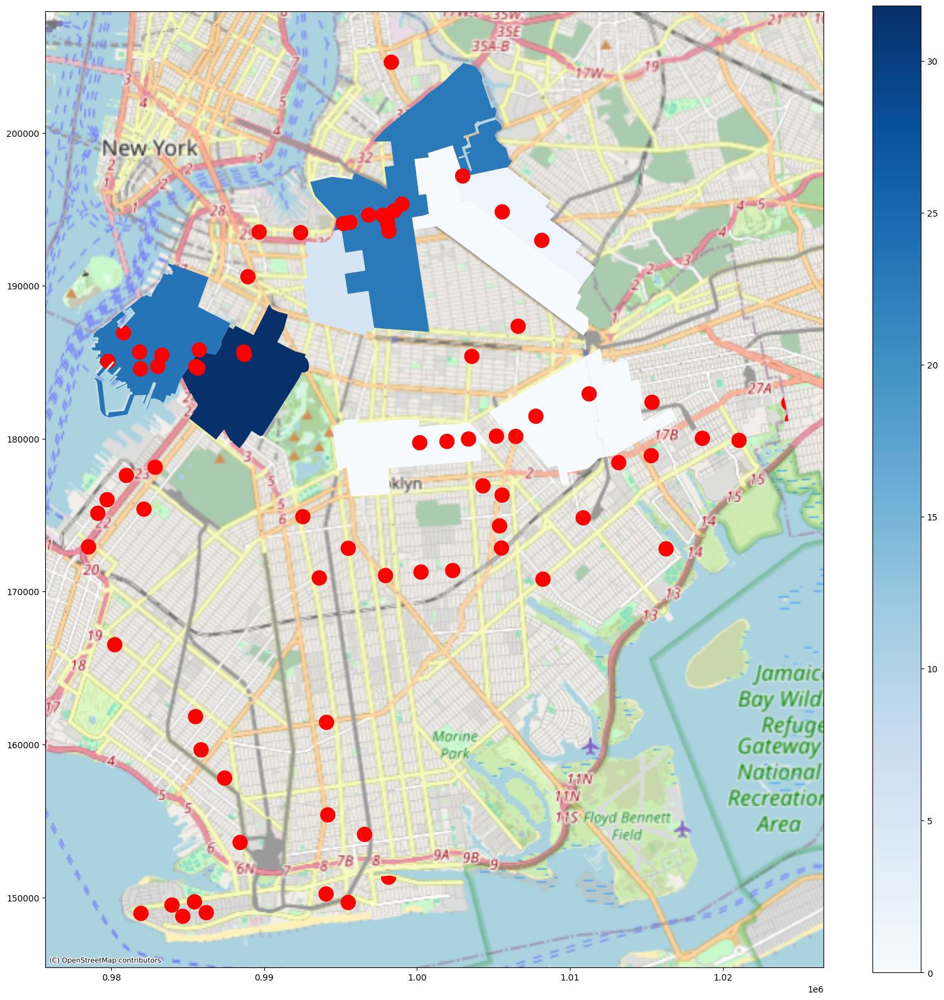

In [291]:
import contextily as ctx
import matplotlib.pyplot as plt

# Create a plot with the 'diff_pct' column from the merged GeoDataFrame
fig, ax = plt.subplots(figsize=(20, 20))  # Set the plot size

ntas.merge(flood_nta_dist).query("boroname == 'Brooklyn'").plot(column = "max", ax = ax, legend = True, linewidth = 3, cmap = "Blues")
floodnet_gdf.overlay(ntas).query("boroname == 'Brooklyn'").plot(ax = ax, markersize = 2, color = "red")
# Add a basemap from contextily
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=ntas.crs)

# Show the plot
plt.show()

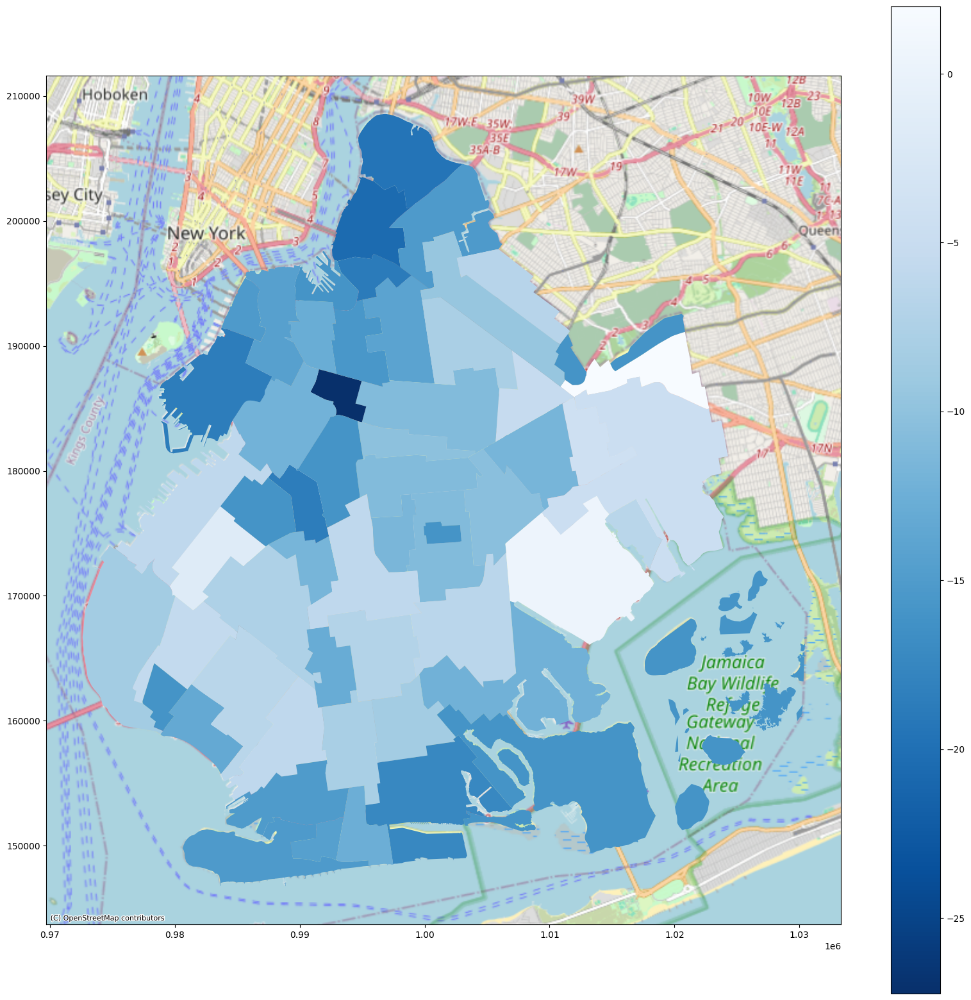

In [298]:
import contextily as ctx
import matplotlib.pyplot as plt

# Create a plot with the 'diff_pct' column from the merged GeoDataFrame
fig, ax = plt.subplots(figsize=(20, 20))  # Set the plot size

ntas.merge(flood_comp_nta).query("boroname == 'Brooklyn'").plot(column = "count_diff_pct", ax = ax, legend = True, linewidth = 3, cmap = "Blues_r")
# Add a basemap from contextily
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=ntas.crs)

# Show the plot
plt.show()

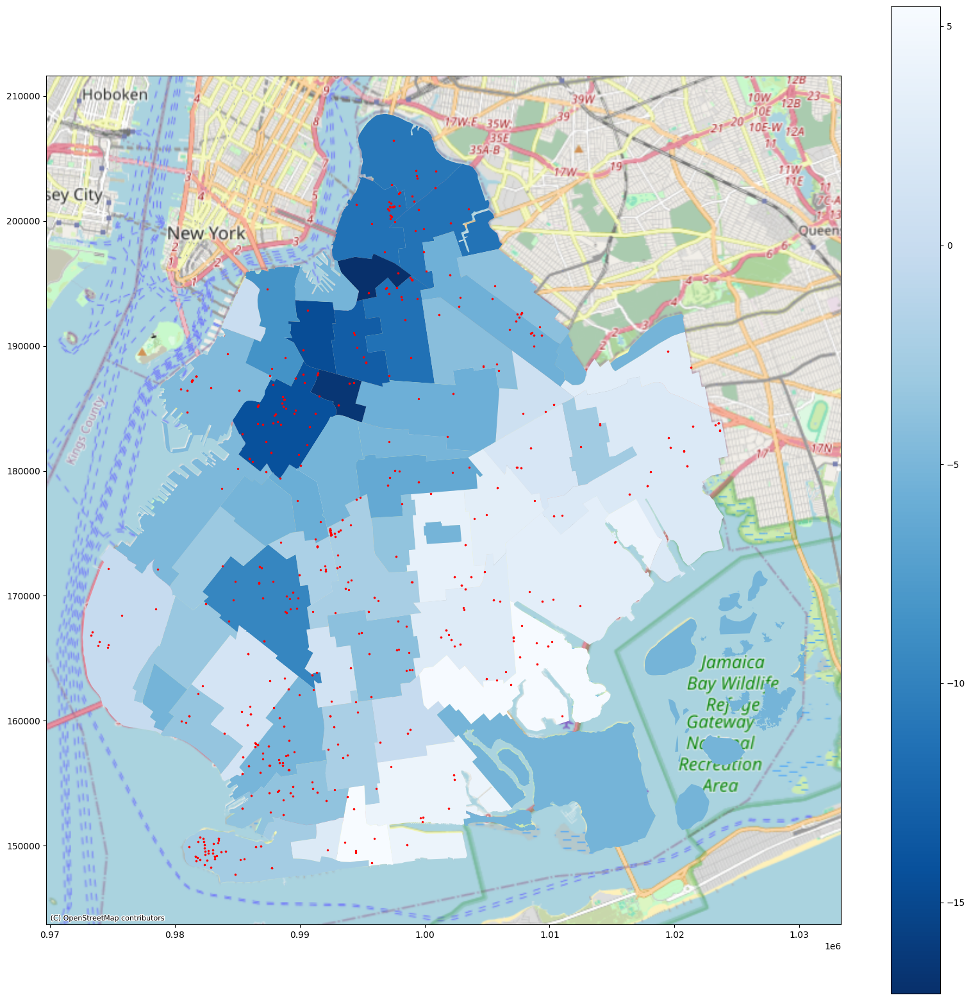

In [188]:
import contextily as ctx
import matplotlib.pyplot as plt

# Create a plot with the 'diff_pct' column from the merged GeoDataFrame
fig, ax = plt.subplots(figsize=(20, 20))  # Set the plot size

ntas.merge(flood_comp_nta).query("boroname == 'Brooklyn'").plot(column = "speed_diff_pct", ax = ax, legend = True, linewidth = 3, cmap = "Blues_r")
flood_data311.query("borough == 'BROOKLYN'").plot(ax = ax, markersize = 2, color = "red")
# Add a basemap from contextily
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=ntas.crs)

# Show the plot
plt.show()

In [118]:
hourly_by_boro = gtfs_speed.groupby(["date", "hour", "day_of_week", "boroname"]).agg(avg_speed = ("speed_mph", "mean"),
                                                                    total_buses = ("unique_trip_id", "nunique")).reset_index()

speed_counts_boro = hourly_by_boro.query("hour >= @flood_start_hour & hour <= @flood_end_hour & day_of_week.isin([1,2,3,4,5])").groupby(["boroname"]).agg(avg_speed = ("avg_speed", "mean"),
                                                                                                                                         hourly_trips = ("total_buses", "mean")).reset_index()
flood_counts_boro = hourly_by_boro.query("hour >= @flood_start_hour & hour <= @flood_end_hour & date == '2023-09-29'").groupby(["boroname"]).agg(avg_speed_flood = ("avg_speed", "mean"),
                                                                                                                                         hourly_trips_flood = ("total_buses", "mean")).reset_index()

flood_comp_boro = flood_counts_boro.merge(speed_counts_boro)
flood_comp_boro["speed_diff"] = flood_comp_boro["avg_speed_flood"] - flood_comp_boro["avg_speed"]
flood_comp_boro["count_diff"] = flood_comp_boro["hourly_trips_flood"] - flood_comp_boro["hourly_trips"]
flood_comp_boro["speed_diff_pct"] = flood_comp_boro["speed_diff"] / flood_comp_boro["avg_speed"] * 100
flood_comp_boro["count_diff_pct"] = flood_comp_boro["count_diff"] / flood_comp_boro["hourly_trips"] * 100

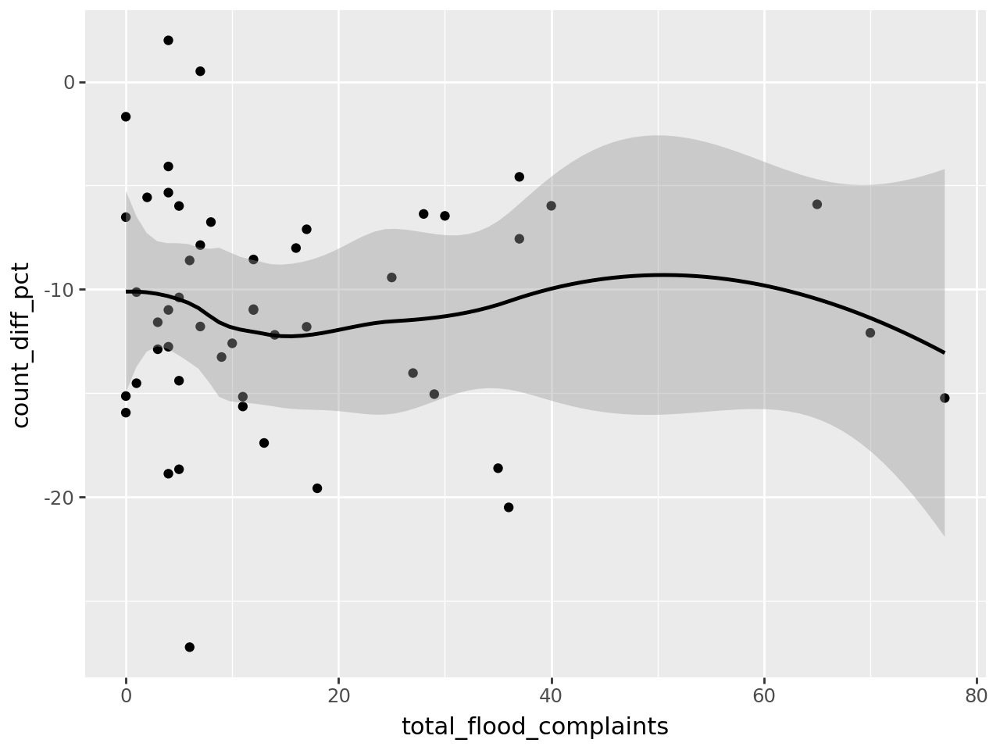

In [129]:
plot_dat = ntas.merge(flood_comp_nta).query("boroname == 'Brooklyn'")
(ggplot(plot_dat, aes(x = "total_flood_complaints", y = "count_diff_pct")) + geom_point() + geom_smooth())

In [132]:
flood_comp_boro

,boroname,avg_speed_flood,hourly_trips_flood,avg_speed,hourly_trips,speed_diff,count_diff,speed_diff_pct,count_diff_pct
0,Bronx,7.838917,908.000000,8.110894,941.744444,-0.271977,-33.744444,-3.353235,-3.583185
1,Brooklyn,7.915927,1353.666667,8.051263,1384.727778,-0.135336,-31.061111,-1.680928,-2.243120
2,Manhattan,6.149382,1265.666667,6.457515,1309.477778,-0.308133,-43.811111,-4.771694,-3.345693
3,Queens,9.981326,1643.333333,10.002776,1581.050000,-0.021451,62.283333,-0.214447,3.939365
4,Staten Island,14.700002,328.888889,14.612586,327.827778,0.087416,1.061111,0.598227,0.323679
